# <center><font color="red">PRCP-1007-LiverPatientPred</center>

## PROBLEM STATEMENT

#### Task 1:-Prepare a complete data analysis report on the given data.

#### Task 2:-Create a predictive model with implementation of  different classifiers on liver patient diseases dataset to predict liver diseases.

#### Task3:- Create an analysis to show on what basis you have designed your model.


## DOMAIN ANALYSIS AND ATTRIBUTES

#### This project falls under "Healthcare" domain focusing on predicting whether an individual has liver disease or not based on the key attributes such as,

##### Age                        : Age of the patient
##### Gender                     : Gender of the patient,categorized as male & female
##### Total Bilirubin            : The overall Bilirubin in the blood,produced from breakdown of Red Blood Cells (RBCs). It consists of both Direct Bilirubin & Indirect Bilirubin. The normal range is usually around 0.3-1.9 mg/dL
##### Direct Bilirubin           : Refers to Bilirubin that has been processed by liver. The normal range is usually around 0-0.3 mg/dL
##### Alkaline Phosphotase       : An enzyme related to Bile ducts. The normal range is usually around 44-147 international units per liter (IU/L)
##### Alamine Aminotransferase   : An enzyme primarily found in the liver. The normal range is usually around 7-56 IU/L
##### Aspartate Aminotransferase : Found in various tissues,including the liver & heart. The normal range is usually around 10–40 IU/L.
##### Total Protiens             : Sum of albumin & globulins in the blood. The normal range is usually around 6.0-8.3 grams per deciliter (g/dL)
##### Albumin                    : Protein made by the liver to maintain blood volume & pressure. The normal range is usually around 3.4-5.4 g/dL
##### Albumin and Globulin Ratio : Provides insight into liver function & immune status. The normal range is usually around 1.0-2.5.
##### Target                     : Field used to split the data into two sets (1 : patient with liver disease and 2: patient with no liver disease)

## 1. IMPORTING LIBRARIES

In [7]:
# Importing pandas library for working with data sets
import pandas as pd

# Importing numpy library for working with arrays
import numpy as np

# Importing matplotlib.pyplot for visualization
import matplotlib.pyplot as plt
%matplotlib inline

# Importing seaborn library for advanced visualization
import seaborn as sns

# Importing warnings for disable warnings from the code
import warnings
# To ignore the warnings
warnings.filterwarnings('ignore')

# YData Profiling for generating an automatic exploratory data analysis (EDA) report
from ydata_profiling import ProfileReport

# Importing OneHotEncoder for encoding categorical variables into numerical format
from sklearn.preprocessing import OneHotEncoder

# MinMaxScaler for feature scaling to bring values within a specific range
from sklearn.preprocessing import MinMaxScaler

# Importing train_test_split for splitting data into training and testing sets for model evaluation
from sklearn.model_selection import train_test_split

# Importing LogisticRegression
from sklearn.linear_model import LogisticRegression

# Importing DecisionTreeClassifier 
from sklearn.tree import DecisionTreeClassifier

# Importing an ensemble model RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Importing an advanced boosting model GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier 

# Importing KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

# Importing RandomizedSearchCV for hyperparameter tuning using randomized search
from sklearn.model_selection import RandomizedSearchCV

# Importing SVC model from sklearn
from sklearn.svm import SVC

# Importing Multi-layer Perceptron (MLP) Classifier
from sklearn.neural_network import MLPClassifier

# Importing performance metrics for model evaluation
# accuracy_score,confusion_matrix,classification_report,etc.
from sklearn.metrics import *

## 2. LOADING THE DATA

In [9]:
# The dataset doesn't have any column names
a = pd.read_csv('Indian Liver Patient Dataset (ILPD).csv')
a

,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.9,1
0,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
1,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
2,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
3,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
4,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
...,...,...,...,...,...,...,...,...,...,...,...
577,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
578,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
579,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
580,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [10]:
# Assigning column names to each column 
columns=['Age','Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio','Target']
columns

['Age',
 'Gender',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio',
 'Target']

In [11]:
# Final data with assigned column names in the dataset
data = pd.read_csv('Indian Liver Patient Dataset (ILPD).csv',names=columns)
data

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


## 3. BASIC CHECKS

In [13]:
# Visualizing the first 10 rows of the data
data.head(10)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
6,26,Female,0.9,0.2,154,16,12,7.0,3.5,1.00,1
7,29,Female,0.9,0.3,202,14,11,6.7,3.6,1.10,1
8,17,Male,0.9,0.3,202,22,19,7.4,4.1,1.20,2
9,55,Male,0.7,0.2,290,53,58,6.8,3.4,1.00,1


In [14]:
# Visualizing the last 10 rows of the data
data.tail(10)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
573,32,Male,3.7,1.6,612,50,88,6.2,1.9,0.40,1
574,32,Male,12.1,6.0,515,48,92,6.6,2.4,0.50,1
575,32,Male,25.0,13.7,560,41,88,7.9,2.5,2.50,1
576,32,Male,15.0,8.2,289,58,80,5.3,2.2,0.70,1
577,32,Male,12.7,8.4,190,28,47,5.4,2.6,0.90,1
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1
582,38,Male,1.0,0.3,216,21,24,7.3,4.4,1.50,2


In [15]:
# Checking the column names of the data
data.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'Target'],
      dtype='object')

In [16]:
# Checking the index of the data
data.index

RangeIndex(start=0, stop=583, step=1)

In [17]:
# Checking the number of rows and columns of the data
data.shape  

(583, 11)

In [18]:
# Checking the basic information of the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         583 non-null    int64  
 1   Gender                      583 non-null    object 
 2   Total_Bilirubin             583 non-null    float64
 3   Direct_Bilirubin            583 non-null    float64
 4   Alkaline_Phosphotase        583 non-null    int64  
 5   Alamine_Aminotransferase    583 non-null    int64  
 6   Aspartate_Aminotransferase  583 non-null    int64  
 7   Total_Protiens              583 non-null    float64
 8   Albumin                     583 non-null    float64
 9   Albumin_and_Globulin_Ratio  579 non-null    float64
 10  Target                      583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


In [19]:
# Checking the statistical information of the numerical column in the data
data.describe()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
count,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,579.000000,583.000000
mean,44.746141,3.298799,1.486106,290.576329,80.713551,109.910806,6.483190,3.141852,0.947064,1.286449
std,16.189833,6.209522,2.808498,242.937989,182.620356,288.918529,1.085451,0.795519,0.319592,0.452490
min,4.000000,0.400000,0.100000,63.000000,10.000000,10.000000,2.700000,0.900000,0.300000,1.000000
25%,33.000000,0.800000,0.200000,175.500000,23.000000,25.000000,5.800000,2.600000,0.700000,1.000000
50%,45.000000,1.000000,0.300000,208.000000,35.000000,42.000000,6.600000,3.100000,0.930000,1.000000
75%,58.000000,2.600000,1.300000,298.000000,60.500000,87.000000,7.200000,3.800000,1.100000,2.000000
max,90.000000,75.000000,19.700000,2110.000000,2000.000000,4929.000000,9.600000,5.500000,2.800000,2.000000


In [20]:
# Checking the statistical information of the categorical column in the data
data.describe(include="O")

,Gender
count,583
unique,2
top,Male
freq,441


In [21]:
# Checking the unique values for all the columns in the data
for i in data.columns:
    print(f"                                {i.title()}                        ")
    print("\n")
    print(f"* The number of unique values in {i} column :",data[i].nunique())
    print(">>",data[i].unique())
    print('==============================================================================')
    print("\n")

                                Age                        


* The number of unique values in Age column : 72
>> [65 62 58 72 46 26 29 17 55 57 64 74 61 25 38 33 40 51 63 34 20 84 52 30
 48 47 45 42 50 85 35 21 32 31 54 37 66 60 19 75 68 70 49 14 13 18 39 27
 36 24 28 53 15 56 44 41  7 22  8  6  4 43 23 12 69 16 78 11 73 67 10 90]


                                Gender                        


* The number of unique values in Gender column : 2
>> ['Female' 'Male']


                                Total_Bilirubin                        


* The number of unique values in Total_Bilirubin column : 113
>> [ 0.7 10.9  7.3  1.   3.9  1.8  0.9  0.6  2.7  1.1  1.6  2.2  2.9  6.8
  1.9  4.1  6.2  4.   2.6  1.3 14.2  1.4  2.4 18.4  3.1  8.9  0.8  2.8
  2.   5.7  8.6  5.8  5.2  3.8  6.6  0.5  5.3  3.2  1.2 12.7 15.9 18.
 23.  22.7  1.7  3.  11.3  4.7  4.2  3.5  5.9  8.7 11.  11.5  4.5 75.
 22.8 14.1 14.8 10.6  8.   1.5  2.1  6.3  2.3 27.2  2.5  3.6 30.5 16.4
 14.5 18.5 23.2  3.7  3.3  7.1  6

In [22]:
# Checking the value_counts 
colls = ["Gender","Total_Protiens","Albumin","Target"]
for i in data[colls]:
    print(data[i].value_counts())
    print('============================')
    print("\n")

Gender
Male      441
Female    142
Name: count, dtype: int64


Total_Protiens
7.0    32
6.0    30
6.8    28
6.9    25
6.2    24
7.1    22
7.2    21
8.0    20
7.3    18
5.6    18
6.4    18
6.1    18
5.5    17
6.6    16
7.5    15
6.5    15
6.7    15
6.3    14
7.9    14
5.8    14
5.9    14
5.4    13
7.4    12
5.2    12
5.7    11
5.0    11
5.1    10
5.3    10
7.8     9
7.6     9
8.2     8
4.9     6
8.1     6
8.5     5
4.5     4
4.4     4
4.6     4
4.3     3
3.6     3
8.4     3
8.6     3
8.3     3
7.7     3
4.8     3
3.9     2
9.2     2
4.1     2
4.7     2
4.0     2
3.8     2
2.7     1
2.8     1
9.5     1
9.6     1
8.9     1
8.7     1
3.0     1
3.7     1
Name: count, dtype: int64


Albumin
3.0    45
4.0    37
2.9    29
3.1    28
3.2    26
3.9    25
2.7    24
2.5    24
3.5    23
2.6    21
2.0    21
3.7    21
3.3    21
3.4    21
3.6    18
2.8    18
2.4    17
4.1    16
3.8    15
4.3    14
2.1    14
4.2    12
2.2    12
1.8    12
2.3    12
1.6     8
4.4     8
1.9     7
4.5     6
4.6     4
4.9   

### Insights:
##### -> There are 583 rows and 11 columns (10 numerical and 1 categorical) in the dataset.
##### -> The value count of 'Gender' column shows there are 441 males and 142 females.
##### -> The value count of 'Target' column shows there are 416 patients with liver disease and 167 patients with no liver disease.

## 4. EXPLORATORY DATA ANALYSIS (EDA)

### 4.1. PROFILE REPORT

In [26]:
report = ProfileReport(data, title="EDA",explorative=False)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 4.2. UNIVARIATE ANALYSIS FOR NUMERICAL COLUMNS

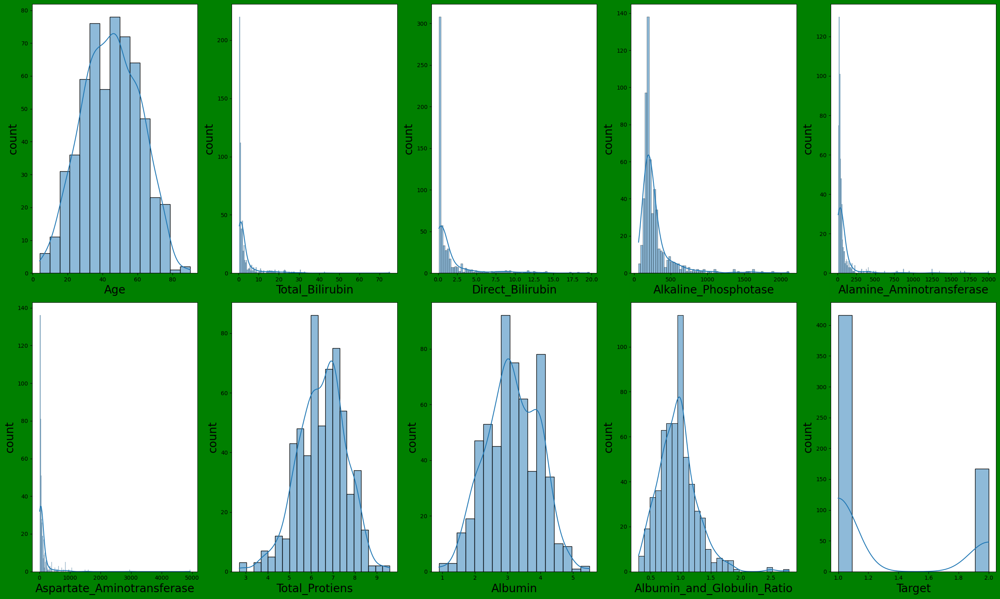

In [28]:
plt.figure(figsize=(25,15),facecolor='green')
plotnumber=1
for i in data.select_dtypes(exclude='object'):
    if plotnumber<=10:
        ax=plt.subplot(2,5,plotnumber)
        sns.histplot(data[i],kde=True)
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.tight_layout()

### 4.3. UNIVARIATE ANALYSIS FOR CATEGORICAL COLUMN

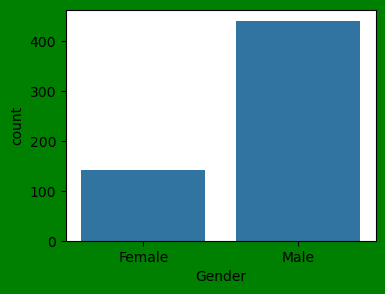

In [30]:
plt.figure(figsize=(4,3),facecolor='green')
for j in data.select_dtypes(include='object'):
    sns.countplot(x=data[j],data=data)
    plt.show()

### 4.4. BIVARIATE ANALYSIS

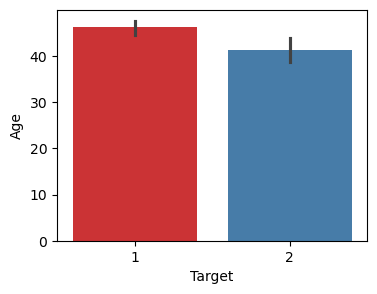

In [32]:
# Target vs Age
plt.figure(figsize=(4,3))
sns.barplot(data,x="Target",y="Age",palette="Set1")
plt.show()

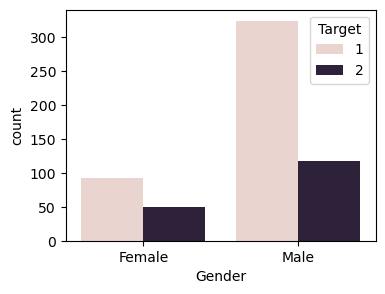

In [33]:
# Gender vs Target
plt.figure(figsize=(4,3))
sns.countplot(x='Gender',hue='Target',data=data)
plt.show()

In [34]:
# Number of males with liver disease in the dataset - 324
len(data[(data['Gender']=='Male') & (data['Target']==1)])

324

In [35]:
# Number of females with liver disease in the dataset - 92
len(data[(data['Gender']=='Female') & (data['Target']==1)])

92

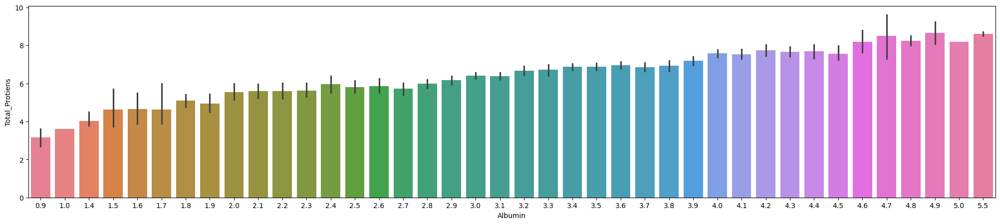

In [36]:
# Albumin vs Total_Proteins
plt.figure(figsize=(25,5))
sns.barplot(data,x='Albumin',y='Total_Protiens',palette='husl')
plt.show()

In [37]:
# Albumin < 3.4 g/dL & Total Proteins < 6.0 g/dL indicate liver disease
b = data[(data['Albumin'] < 3.4) & (data['Total_Protiens'] < 6.0) & (data['Target']==1)]
print(f'{b[['Total_Protiens','Albumin','Target']]}\n')
print(f'Patients with liver disease who present with low Albumin and Total_Proteins levels :{len(b)}')

     Total_Protiens  Albumin  Target
10              5.9      2.7       1
14              5.8      2.7       1
23              4.3      1.6       1
25              5.0      2.7       1
26              5.0      2.7       1
..              ...      ...     ...
550             5.6      2.4       1
552             5.8      2.9       1
570             5.4      2.6       1
576             5.3      2.2       1
577             5.4      2.6       1

[123 rows x 3 columns]

Patients with liver disease who present with low Albumin and Total_Proteins levels :123


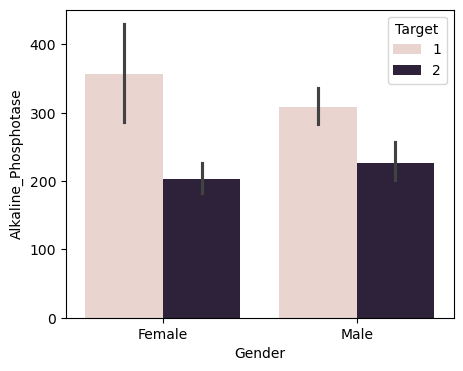

In [38]:
# Gender vs Alkaline_Phosphotase
plt.figure(figsize=(5,4))
sns.barplot(data,x='Gender',y='Alkaline_Phosphotase',hue='Target')
plt.show()

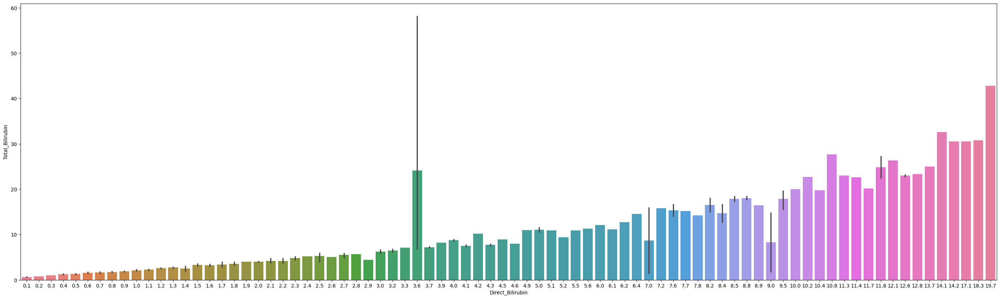

In [39]:
# Direct_Bilirubin vs Total_Bilirubin
plt.figure(figsize=(35,10))
sns.barplot(x='Direct_Bilirubin',y='Total_Bilirubin',data=data,palette='husl')
plt.show()

In [40]:
# Direct_Bilirubin > 0.3 mg/dL & Total_Bilirubin > 1.9 mg/dL indicate liver disease
c = data[(data['Direct_Bilirubin'] > 0.3) & (data['Total_Bilirubin'] > 1.9) & (data['Target']==1)]
print(f'{c[['Total_Bilirubin','Direct_Bilirubin','Target']]}\n')
print(f'Patients with liver disease who present with high Direct_Bilirubin and Total_Bilirubin levels :{len(c)}')

     Total_Bilirubin  Direct_Bilirubin  Target
1               10.9               5.5       1
2                7.3               4.1       1
4                3.9               2.0       1
11               2.7               1.3       1
20               2.2               1.0       1
..               ...               ...     ...
573              3.7               1.6       1
574             12.1               6.0       1
575             25.0              13.7       1
576             15.0               8.2       1
577             12.7               8.4       1

[165 rows x 3 columns]

Patients with liver disease who present with high Direct_Bilirubin and Total_Bilirubin levels :165


## 4.5. MULTIVARIATE ANALYSIS

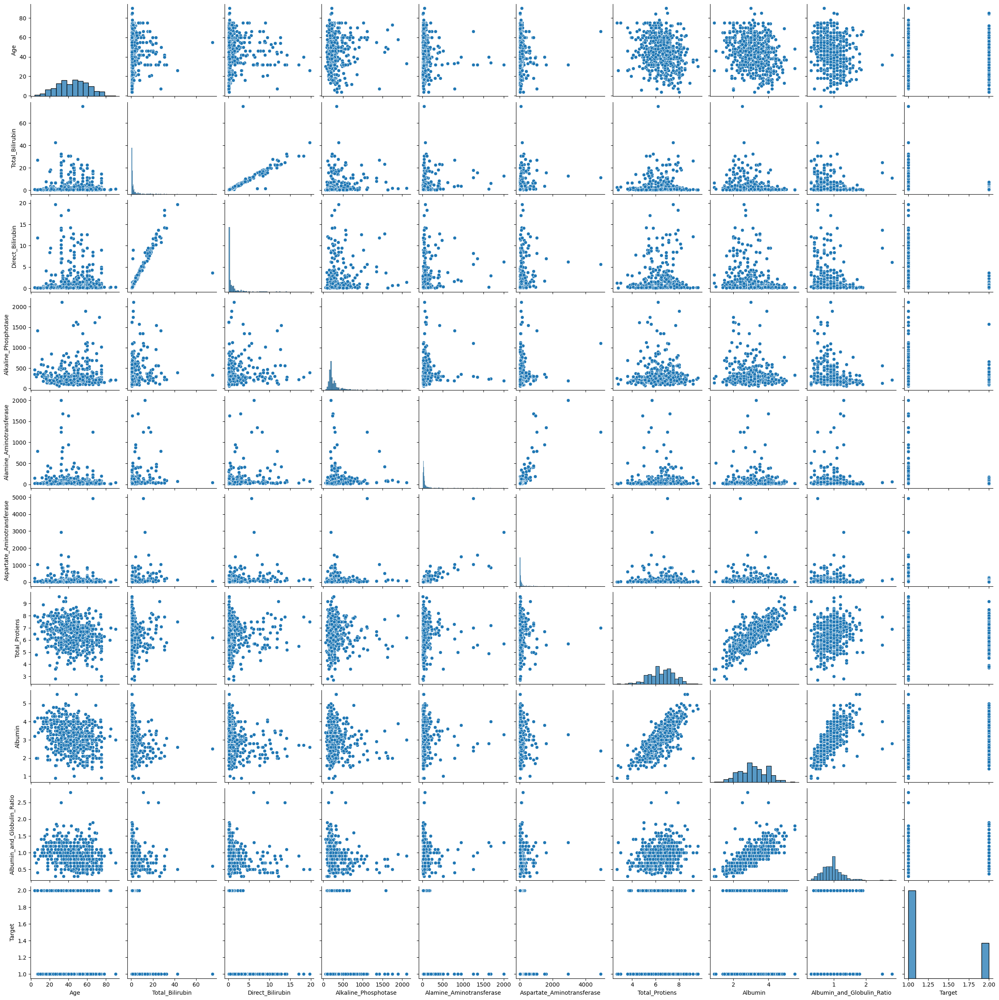

In [42]:
sns.pairplot(data)
plt.show()

## INSIGHTS FROM EDA
##### -> Liver diseases are more common in patients aged above 40.
##### -> There are 324 males with liver disease and 92 females with liver disease in the dataset, indicating that the number of males with liver disease is higher than that of females with liver disease.
##### -> There are 123 patients with liver disease who present with low levels of both Albumin and Total Proteins. 
##### -> Females with higher Alkaline Phosphatase levels compared to males tend to have liver disease.
##### -> There are 165 patients with liver disease who present with high levels of both Direct and Total Bilirubin.

# 5. DATA PREPROCESSING

## 5.1. CHECKING NULL VALUES 

In [46]:
data.isnull().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    4
Target                        0
dtype: int64

## 5.2. Handling null values

In [48]:
data['Albumin_and_Globulin_Ratio']=data['Albumin_and_Globulin_Ratio'].fillna(data['Albumin_and_Globulin_Ratio'].median())

In [49]:
# Verification
data.isnull().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
Target                        0
dtype: int64

## 5.3. CHECKING DUPLICATE VALUES 

In [51]:
data.duplicated().sum()

13

In [52]:
# Checking duplicated rows
duplicate_rows= data[data.duplicated()]
duplicate_rows               

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
19,40,Female,0.9,0.3,293,232,245,6.8,3.1,0.80,1
26,34,Male,4.1,2.0,289,875,731,5.0,2.7,1.10,1
34,38,Female,2.6,1.2,410,59,57,5.6,3.0,0.80,2
55,42,Male,8.9,4.5,272,31,61,5.8,2.0,0.50,1
62,58,Male,1.0,0.5,158,37,43,7.2,3.6,1.00,1
106,36,Male,5.3,2.3,145,32,92,5.1,2.6,1.00,2
108,36,Male,0.8,0.2,158,29,39,6.0,2.2,0.50,2
138,18,Male,0.8,0.2,282,72,140,5.5,2.5,0.80,1
143,30,Male,1.6,0.4,332,84,139,5.6,2.7,0.90,1
158,72,Male,0.7,0.1,196,20,35,5.8,2.0,0.50,1


## 5.4. Dropping the duplicates

In [54]:
data.drop_duplicates(inplace=True)

In [55]:
# Verification
data.duplicated().sum()

0

In [56]:
data.shape

(570, 11)

## 5.5. CHECKING CORRUPTED VALUES

In [58]:
cor_val=['Age','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio','Target']

for i in cor_val:
    if (data[i]==0).any():
         print(f'{i}: There are corrupted values in the column\n')
    else:
        print(f'{i}: There are no corrupted values in the column\n') 

Age: There are no corrupted values in the column

Alkaline_Phosphotase: There are no corrupted values in the column

Alamine_Aminotransferase: There are no corrupted values in the column

Aspartate_Aminotransferase: There are no corrupted values in the column

Total_Protiens: There are no corrupted values in the column

Albumin: There are no corrupted values in the column

Albumin_and_Globulin_Ratio: There are no corrupted values in the column

Target: There are no corrupted values in the column



## 5.6. Identifying outliers

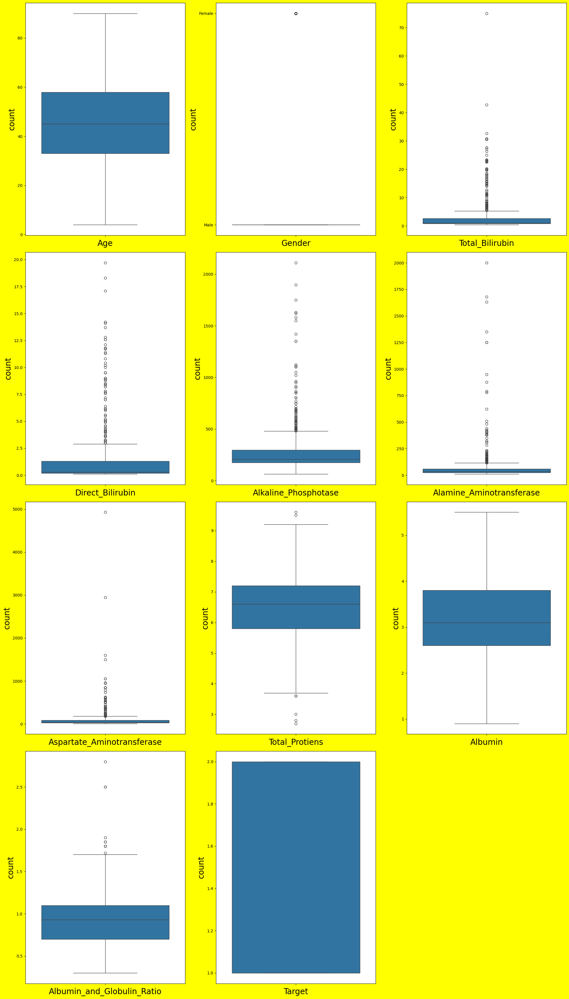

In [60]:
# boxplot to identify outliers
plt.figure(figsize=(20,35),facecolor='yellow')
plotnumber=1
for i in data.columns:
    if plotnumber<=11:
        ax=plt.subplot(4,3,plotnumber)
        sns.boxplot(data[i])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.tight_layout()

## 5.7. Handling the outliers

In [62]:
from scipy.stats.mstats import winsorize

# Different limits for each column based on their distribution
winsor_limits = {'Total_Bilirubin': (0, 0.15), 
                 'Direct_Bilirubin': (0, 0.15), 
                 'Alkaline_Phosphotase': (0, 0.13), 
                 'Alamine_Aminotransferase': (0, 0.13), 
                 'Aspartate_Aminotransferase': (0, 0.13), 
                 'Total_Protiens': (0.02, 0.01), 
                 'Albumin_and_Globulin_Ratio': (0,0.02)}

for col, lim in winsor_limits.items():
    data[col] = winsorize(data[col], limits=lim)

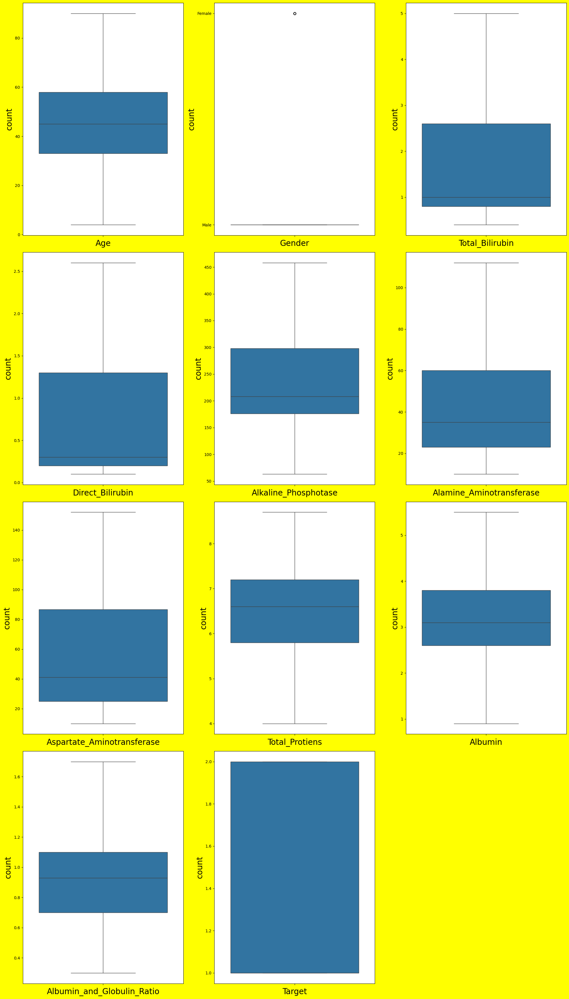

In [63]:
# Verification
plt.figure(figsize=(20,35),facecolor='yellow')
plotnumber=1
for i in data.columns:
    if plotnumber<=11:
        ax=plt.subplot(4,3,plotnumber)
        sns.boxplot(data[i])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.tight_layout()

## 5.8. ENCODING CATEGORICAL COLUMN

### 5.8.1. ONE HOT ENCODING

### Gender

In [67]:
# Initializing OneHotEncoder
ohe_gen = OneHotEncoder()

In [68]:
# Fitting and transforming the "Gender" column
gen_encoded = ohe_gen.fit_transform(data[['Gender']]).toarray()
gen_encoded

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [69]:
# Getting OneHotEncoder output features names
ohe_gen.get_feature_names_out()

array(['Gender_Female', 'Gender_Male'], dtype=object)

In [70]:
# Creating a DataFrame of encoded array
gen_encoded_df = pd.DataFrame(gen_encoded.astype(int), index=data.index, columns=['Gender_Female', 'Gender_Male'])
gen_encoded_df

,Gender_Female,Gender_Male
0,1,0
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
578,0,1
579,0,1
580,0,1
581,0,1


In [71]:
# Dropping first column from sex_encoded_df
gen_encoded_df.drop('Gender_Female',axis=1,inplace=True)
gen_encoded_df

,Gender_Male
0,0
1,1
2,1
3,1
4,1
...,...
578,1
579,1
580,1
581,1


In [72]:
# Concatenating "gen_encoded_df" to the original dataframe
data = pd.concat([gen_encoded_df,data],axis=1)
data

,Gender_Male,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,1,62,Male,5.0,2.6,458,64,100,7.5,3.2,0.74,1
2,1,62,Male,5.0,2.6,458,60,68,7.0,3.3,0.89,1
3,1,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,1,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...,...
578,1,60,Male,0.5,0.1,458,20,34,5.9,1.6,0.37,2
579,1,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,1,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,1,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [73]:
# Removing the 'Gender' column from the data
data.drop("Gender",axis=1,inplace=True)
data

,Gender_Male,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,65,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,1,62,5.0,2.6,458,64,100,7.5,3.2,0.74,1
2,1,62,5.0,2.6,458,60,68,7.0,3.3,0.89,1
3,1,58,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,1,72,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,1,60,0.5,0.1,458,20,34,5.9,1.6,0.37,2
579,1,40,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,1,52,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,1,31,1.3,0.5,184,29,32,6.8,3.4,1.00,1


## 5.9. FEATURE SELECTION

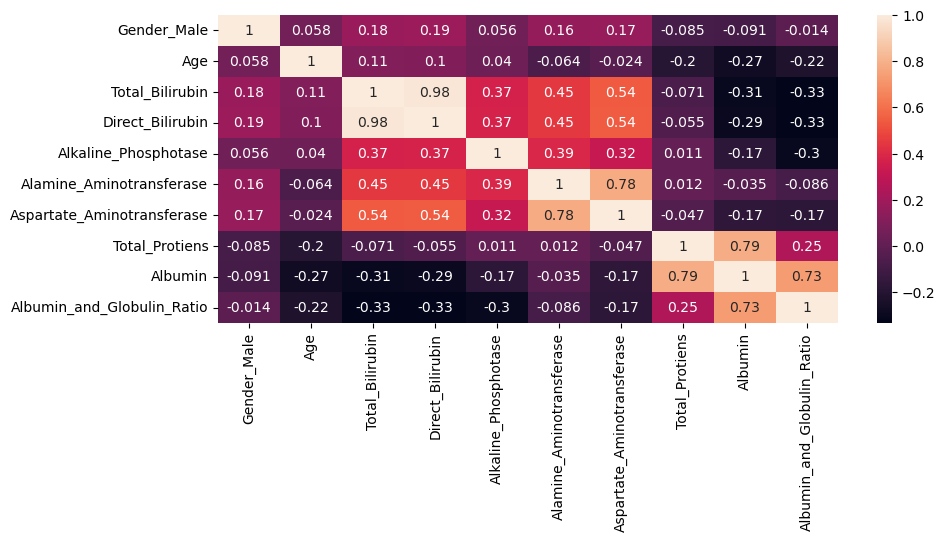

In [75]:
# Check for correlation to avoid multicollinearity
plt.figure(figsize=(10,4))
sns.heatmap(data=data.iloc[:,:-1].corr(),annot=True)
plt.show()

### 5.9.1. Correlation-Based Feature Selection

In [77]:
# Compute absolute correlations
corr_matrix = data.iloc[:,:-1].corr().abs()

# Identify columns those with any correlation >0.80 to others & exclude 1
s = (corr_matrix > 0.80) & (corr_matrix < 1.0)  
high_corr_cols = corr_matrix.columns[s.any()]
high_corr_cols

Index(['Total_Bilirubin', 'Direct_Bilirubin'], dtype='object')

In [78]:
# Drop any one highly correlated column
data = data.drop(columns='Direct_Bilirubin')
data

,Gender_Male,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,65,0.7,187,16,18,6.8,3.3,0.90,1
1,1,62,5.0,458,64,100,7.5,3.2,0.74,1
2,1,62,5.0,458,60,68,7.0,3.3,0.89,1
3,1,58,1.0,182,14,20,6.8,3.4,1.00,1
4,1,72,3.9,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...
578,1,60,0.5,458,20,34,5.9,1.6,0.37,2
579,1,40,0.6,98,35,31,6.0,3.2,1.10,1
580,1,52,0.8,245,48,49,6.4,3.2,1.00,1
581,1,31,1.3,184,29,32,6.8,3.4,1.00,1


## 5.10. SCALING FOR NUMERICAL COLUMNS

### 5.10.1. Using MinmaxScaler

In [81]:
df=MinMaxScaler().fit_transform(data.iloc[:,:-1])
df

array([[0.        , 0.70930233, 0.06521739, ..., 0.59574468, 0.52173913,
        0.42857143],
       [1.        , 0.6744186 , 1.        , ..., 0.74468085, 0.5       ,
        0.31428571],
       [1.        , 0.6744186 , 1.        , ..., 0.63829787, 0.52173913,
        0.42142857],
       ...,
       [1.        , 0.55813953, 0.08695652, ..., 0.5106383 , 0.5       ,
        0.5       ],
       [1.        , 0.31395349, 0.19565217, ..., 0.59574468, 0.54347826,
        0.5       ],
       [1.        , 0.39534884, 0.13043478, ..., 0.70212766, 0.76086957,
        0.85714286]])

## 6. DATA SPLITTING

In [83]:
x = pd.DataFrame(df,columns=data.columns[:-1]) # Independent variables
x

,Gender_Male,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,0.0,0.709302,0.065217,0.313924,0.058824,0.056338,0.595745,0.521739,0.428571
1,1.0,0.674419,1.000000,1.000000,0.529412,0.633803,0.744681,0.500000,0.314286
2,1.0,0.674419,1.000000,1.000000,0.490196,0.408451,0.638298,0.521739,0.421429
3,1.0,0.627907,0.130435,0.301266,0.039216,0.070423,0.595745,0.543478,0.500000
4,1.0,0.790698,0.760870,0.334177,0.166667,0.345070,0.702128,0.326087,0.071429
...,...,...,...,...,...,...,...,...,...
565,1.0,0.651163,0.021739,1.000000,0.098039,0.169014,0.404255,0.152174,0.050000
566,1.0,0.418605,0.043478,0.088608,0.245098,0.147887,0.425532,0.500000,0.571429
567,1.0,0.558140,0.086957,0.460759,0.372549,0.274648,0.510638,0.500000,0.500000
568,1.0,0.313953,0.195652,0.306329,0.186275,0.154930,0.595745,0.543478,0.500000


In [84]:
y=data.Target # Dependent variable
y

0      1
1      1
2      1
3      1
4      1
      ..
578    2
579    1
580    1
581    1
582    2
Name: Target, Length: 570, dtype: int64

## 6.1. train_test_split for splitting the data

In [86]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(456, 9)
(114, 9)
(456,)
(114,)


In [87]:
y_train.value_counts()

Target
1    321
2    135
Name: count, dtype: int64

In [88]:
# Initializing SMOTE
from imblearn.over_sampling import SMOTE
smote= SMOTE(random_state=42)

# fitting and resampling training data
x_train_smote,y_train_smote=smote.fit_resample(x_train,y_train)

## 7. MODEL CREATION

### 7.1. LOGISTIC REGRESSION

In [91]:
log_model=LogisticRegression()
log_model.fit(x_train_smote,y_train_smote)
y_pred=log_model.predict(x_test)
print(f' log_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' log_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' log_classification_report :{classification_report(y_test,y_pred)}')

 log_f1_score :0.6762589928057554

 log_confusion_matrix :[[47 38]
 [ 7 22]]

 log_classification_report :              precision    recall  f1-score   support

           1       0.87      0.55      0.68        85
           2       0.37      0.76      0.49        29

    accuracy                           0.61       114
   macro avg       0.62      0.66      0.59       114
weighted avg       0.74      0.61      0.63       114



### 7.1.1. HYPERPARAMETER TUNING (LOGISTIC REGRESSION)

In [93]:
log_params = {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
              'C' : list(np.logspace(-4, 4, 20)),
              'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
              'max_iter' : [100,200,300,400,500]}

log_reg=LogisticRegression()
log_cv=RandomizedSearchCV(log_reg,param_distributions=log_params,scoring='f1',n_jobs=-1,verbose=3,cv=5)
log_cv.fit(x_train_smote,y_train_smote)
log_best_params=log_cv.best_params_
print(f'best parameters:{log_best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best parameters:{'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 500, 'C': 206.913808111479}


In [94]:
# best parameters:{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 300, 'C': 0.0006951927961775605}
log=LogisticRegression(**log_best_params)
log.fit(x_train_smote,y_train_smote)
y_pred=log.predict(x_test)
f1_score(y_test,y_pred)

0.6762589928057554

### 7.1.2. FINALIZED, HYPERPARAMETER TUNING (LOGISTIC REGRESSION)

In [96]:
f1_log=[]
for i in range(0,43):
    log_model=LogisticRegression(solver='liblinear',penalty='l1',max_iter= 300,C=0.0006951927961775605,random_state=i)
    log_model.fit(x_train_smote,y_train_smote)
    y_pred=log_model.predict(x_test)
    f1_log.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_log),'is ',f1_log[np.argmax(f1_log)])

The best f1_score obtained for the random_state  0 is  0.8542713567839196


In [97]:
log_f1=0.8542713567839196

## 7.2. DECISION TREE

In [99]:
dt_model=DecisionTreeClassifier(criterion='gini',random_state=42)
dt_model.fit(x_train_smote,y_train_smote)
y_pred=dt_model.predict(x_test)
print(f' dt_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' dt_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' dt_classification_report :{classification_report(y_test,y_pred)}')

 dt_f1_score :0.7133757961783439

 dt_confusion_matrix :[[56 29]
 [16 13]]

 dt_classification_report :              precision    recall  f1-score   support

           1       0.78      0.66      0.71        85
           2       0.31      0.45      0.37        29

    accuracy                           0.61       114
   macro avg       0.54      0.55      0.54       114
weighted avg       0.66      0.61      0.63       114



### 7.2.1. HYPERPARAMETER TUNING (DECISION TREE)

In [101]:
dt_params={'criterion':['gini','entropy'],
           'splitter':['best','random'],
           'max_depth':list(range(1,10)),
           'min_samples_split':list(range(2,10)),
           'min_samples_leaf':list(range(1,10))}

tree_clf=DecisionTreeClassifier()
tree_cv=RandomizedSearchCV(tree_clf,param_distributions=dt_params,scoring='f1',n_jobs=-1,verbose=3,cv=5)
tree_cv.fit(x_train_smote,y_train_smote)
dt_best_params=tree_cv.best_params_
print(f'best parameters:{dt_best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best parameters:{'splitter': 'random', 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_depth': 7, 'criterion': 'gini'}


In [102]:
# best parameters:{'splitter': 'random', 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_depth': 9, 'criterion': 'entropy'}
dt=DecisionTreeClassifier(**dt_best_params)
dt.fit(x_train_smote,y_train_smote)
y_pred=dt.predict(x_test)
f1_score(y_test,y_pred) 

0.6222222222222222

### 7.2.2. FINALIZED, HYPERPARAMETER TUNING (DECISION TREE)

In [104]:
f1_dt=[]
for i in range(0,43):
    dt_model=DecisionTreeClassifier(splitter='random',min_samples_split=9,min_samples_leaf=7,max_depth=9,criterion='entropy',random_state=i)
    dt_model.fit(x_train_smote,y_train_smote)
    y_pred=dt_model.predict(x_test)
    f1_dt.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_dt),'is ',f1_dt[np.argmax(f1_dt)])

The best f1_score obtained for the random_state  6 is  0.7975460122699386


In [105]:
dt_f1=0.7975460122699386

## 7.3. RANDOM FOREST

In [107]:
rf_model=RandomForestClassifier()
rf_model.fit(x_train_smote,y_train_smote)
y_pred=rf_model.predict(x_test)
print(f' rf_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' rf_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' rf_classification_report :{classification_report(y_test,y_pred)}')

 rf_f1_score :0.7950310559006211

 rf_confusion_matrix :[[64 21]
 [12 17]]

 rf_classification_report :              precision    recall  f1-score   support

           1       0.84      0.75      0.80        85
           2       0.45      0.59      0.51        29

    accuracy                           0.71       114
   macro avg       0.64      0.67      0.65       114
weighted avg       0.74      0.71      0.72       114



### 7.3.1. HYPERPARAMETER TUNING (RANDOM FOREST)

In [109]:
random_grid={'n_estimators':[100,200,300,400,500],
             'max_features':['auto','sqrt','log2'],
             'max_depth':list(range(1,20)),
             'min_samples_split':list(range(2,10)),
             'min_samples_leaf':list(range(1,10))}

rf_clf=RandomForestClassifier()
rf_cv=RandomizedSearchCV(estimator=rf_clf,param_distributions=random_grid,scoring='f1',cv=5,verbose=3,n_jobs=-1)
rf_cv.fit(x_train_smote,y_train_smote)
rf_best_params=rf_cv.best_params_
print(f'best_parameters:{rf_best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'n_estimators': 300, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 19}


In [110]:
# best_parameters:{'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'max_depth': 14}
rf_model1=RandomForestClassifier(**rf_best_params)
rf_model1.fit(x_train_smote,y_train_smote)
y_pred=rf_model1.predict(x_test)
f1_score(y_test,y_pred)

0.7875

### 7.3.2. FINALIZED, HYPERPARAMETER TUNING (RANDOM FOREST)

In [112]:
f1_rf=[]
for i in range(0,43):
    rf_model=RandomForestClassifier(n_estimators=100,min_samples_split=4,min_samples_leaf=3,max_features='sqrt',max_depth=14,random_state=i)
    rf_model.fit(x_train_smote,y_train_smote)
    y_pred=rf_model.predict(x_test)
    f1_rf.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_rf),'is ',f1_rf[np.argmax(f1_rf)])

The best f1_score obtained for the random_state  38 is  0.8125


In [113]:
rf_f1=0.8125

## 7.4. GRADIENT BOOSTING

In [115]:
gb_model=GradientBoostingClassifier()
gb_model.fit(x_train_smote,y_train_smote)
y_pred=gb_model.predict(x_test)
print(f' gb_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' gb_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' gb_classification_report :{classification_report(y_test,y_pred)}')

 gb_f1_score :0.7607361963190185

 gb_confusion_matrix :[[62 23]
 [16 13]]

 gb_classification_report :              precision    recall  f1-score   support

           1       0.79      0.73      0.76        85
           2       0.36      0.45      0.40        29

    accuracy                           0.66       114
   macro avg       0.58      0.59      0.58       114
weighted avg       0.68      0.66      0.67       114



### 7.4.1 HYPERPARAMETR TUNING (GRADIENT BOOSTING)

In [117]:
param_grid={'learning_rate':[0.001,0.01,0.03,0.1,0.2],
            'max_depth':list(range(1,20)),
            'n_estimators':[100,200,300,400,500],
            'loss':['log_loss','exponential'],
            'criterion':['friedman_mse','squared_error']}
gb=GradientBoostingClassifier()
gb_cv=RandomizedSearchCV(estimator=gb,scoring='f1',param_distributions=param_grid,cv=5,verbose=2,n_jobs=-1)
gb_cv.fit(x_train_smote,y_train_smote)
best_params=gb_cv.best_params_
print(f'best_params:{best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_params:{'n_estimators': 500, 'max_depth': 3, 'loss': 'log_loss', 'learning_rate': 0.2, 'criterion': 'squared_error'}


In [118]:
# best_params:{'n_estimators': 300, 'max_depth': 10, 'loss': 'exponential', 'learning_rate': 0.2, 'criterion': 'friedman_mse'}
gb_model1=GradientBoostingClassifier(**best_params)
gb_model1.fit(x_train_smote,y_train_smote)
y_pred=gb_model1.predict(x_test)
f1_score(y_test,y_pred)

0.7810650887573964

### 7.4.2. FINALIZED, HYPERPARAMETER TUNING (GRADIENT BOOSTING)

In [120]:
f1_gb=[]
for i in range(0,43):
    gb_model=GradientBoostingClassifier(n_estimators=300,max_depth=10,loss='exponential',learning_rate=0.2,criterion='friedman_mse',random_state=i)
    gb_model.fit(x_train_smote,y_train_smote)
    y_pred=gb_model.predict(x_test)
    f1_gb.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_gb),'is ',f1_gb[np.argmax(f1_gb)])

The best f1_score obtained for the random_state  0 is  0.8372093023255814


In [121]:
gb_f1=0.8372093023255814

## 7.5. KNN

In [123]:
knn_model=KNeighborsClassifier()
knn_model.fit(x_train_smote,y_train_smote)
y_pred=knn_model.predict(x_test)
print(f' knn_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' knn_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' knn_classification_report :{classification_report(y_test,y_pred)}')

 knn_f1_score :0.7066666666666667

 knn_confusion_matrix :[[53 32]
 [12 17]]

 knn_classification_report :              precision    recall  f1-score   support

           1       0.82      0.62      0.71        85
           2       0.35      0.59      0.44        29

    accuracy                           0.61       114
   macro avg       0.58      0.60      0.57       114
weighted avg       0.70      0.61      0.64       114



### 7.5.1 HYPERPARAMETR TUNING (KNN)

In [125]:
param_grid={'n_neighbors':[1,3,5,7,9,11,15],
            'weights':['uniform','distance'],
            'algorithm':['auto','ball_tree','kd_tree','brute'],
            'p':[1,2]}
knn=RandomizedSearchCV(estimator=KNeighborsClassifier(),param_distributions=param_grid,scoring='f1',n_jobs=-1,verbose=2,cv=5)
knn.fit(x_train_smote,y_train_smote)
best_params=knn.best_params_
print(f'best_parameters:{best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'weights': 'distance', 'p': 1, 'n_neighbors': 1, 'algorithm': 'ball_tree'}


In [126]:
# best_parameters:{'weights': 'uniform', 'p': 1, 'n_neighbors': 1, 'algorithm': 'auto'}
knn_model1=KNeighborsClassifier(**best_params)
knn_model1.fit(x_train_smote,y_train_smote)
y_pred=knn_model1.predict(x_test)
f1_score(y_test,y_pred)

0.7901234567901234

### 7.5.2. FINALIZED, HYPERPARAMETER TUNING (KNN)

In [128]:
knn_model=KNeighborsClassifier(weights='uniform',p=1,n_neighbors=1,algorithm='auto')
knn_model.fit(x_train_smote,y_train_smote)
y_pred=knn_model.predict(x_test)
knn_f1=f1_score(y_test,y_pred)
knn_f1

0.7901234567901234

## 7.6. ARTIFICIAL NEURAL NETWORKS

In [130]:
ann_model=MLPClassifier()
ann_model.fit(x_train_smote,y_train_smote)
y_pred=ann_model.predict(x_test)
print(f' ann_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' ann_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' ann_classification_report :{classification_report(y_test,y_pred)}')

 ann_f1_score :0.7132867132867133

 ann_confusion_matrix :[[51 34]
 [ 7 22]]

 ann_classification_report :              precision    recall  f1-score   support

           1       0.88      0.60      0.71        85
           2       0.39      0.76      0.52        29

    accuracy                           0.64       114
   macro avg       0.64      0.68      0.62       114
weighted avg       0.76      0.64      0.66       114



### 7.6.1 HYPERPARAMETR TUNING (ANN)

In [132]:
param_grid = {'hidden_layer_sizes': [(100,),(200,),(300,),(400,),(500,),(1000,) ],
              'activation': ['relu', 'tanh', 'logistic'],
              'solver': ['adam', 'lbfgs', 'sgd'],
              'alpha': [0.0001, 0.001, 0.01],
              'learning_rate_init': [0.001, 0.01, 0.1]}

ann=RandomizedSearchCV(estimator=MLPClassifier(),param_distributions=param_grid,scoring='f1',n_jobs=-1,verbose=2,cv=5)
ann.fit(x_train_smote,y_train_smote)
best_params=ann.best_params_
print(f'best_parameters:{best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'solver': 'lbfgs', 'learning_rate_init': 0.001, 'hidden_layer_sizes': (1000,), 'alpha': 0.01, 'activation': 'relu'}


In [133]:
# best_parameters:{'solver': 'adam', 'learning_rate_init': 0.01, 'hidden_layer_sizes': (1000,), 'alpha': 0.01, 'activation': 'relu'}
ann_model1=MLPClassifier(**best_params)
ann_model1.fit(x_train_smote,y_train_smote)
y_pred=ann_model1.predict(x_test)
f1_score(y_test,y_pred)

0.7784431137724551

### 7.6.2. FINALIZED, HYPERPARAMETER TUNING (ANN)

In [135]:
f1_ann=[]
for i in range(0,43):
    ann_model=MLPClassifier(solver='adam',learning_rate_init=0.01,hidden_layer_sizes=(1000,),alpha=0.01,activation='relu',random_state=i)
    ann_model.fit(x_train_smote,y_train_smote)
    y_pred=ann_model.predict(x_test)
    f1_ann.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_ann),'is ',f1_ann[np.argmax(f1_ann)])

The best f1_score obtained for the random_state  42 is  0.8488372093023255


In [136]:
ann_f1=0.8488372093023255

## 7.7. SUPPORT VECTOR MACHINE

In [138]:
svm_model=SVC()
svm_model.fit(x_train_smote,y_train_smote)
y_pred=svm_model.predict(x_test)
print(f' svm_f1_score :{f1_score(y_test,y_pred)}\n')
print(f' svm_confusion_matrix :{confusion_matrix(y_test,y_pred)}\n')
print(f' svm_classification_report :{classification_report(y_test,y_pred)}')

 svm_f1_score :0.6906474820143885

 svm_confusion_matrix :[[48 37]
 [ 6 23]]

 svm_classification_report :              precision    recall  f1-score   support

           1       0.89      0.56      0.69        85
           2       0.38      0.79      0.52        29

    accuracy                           0.62       114
   macro avg       0.64      0.68      0.60       114
weighted avg       0.76      0.62      0.65       114



### 7.7.1. HYPERPARAMETER TUNING (SVM)

In [140]:
param_grid={'C':[1,2,3,4,5,6],
            'kernel':['rbf','poly','linear','sigmoid'],
            'degree':[1,2,3,4,5],
            'gamma':['scale', 'auto']}

svm=SVC()
svm_cv=RandomizedSearchCV(estimator=svm,scoring='f1',param_distributions=param_grid,cv=5,verbose=2,n_jobs=-1)
svm_cv.fit(x_train_smote,y_train_smote)
best_params=svm_cv.best_params_
print(f'best_params:{best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_params:{'kernel': 'poly', 'gamma': 'scale', 'degree': 4, 'C': 3}


In [141]:
# best_params:{'kernel': 'poly', 'gamma': 'scale', 'degree': 5, 'C': 5}
svm_model1=SVC(**best_params)
svm_model1.fit(x_train_smote,y_train_smote)
y_pred=svm_model1.predict(x_test)
f1_score(y_test,y_pred)

0.7083333333333334

### 7.7.2. FINALIZED, HYPERPARAMETER TUNING (SVM)

In [143]:
f1_svm=[]
for i in range(0,43):
    svm_model=SVC(kernel='poly',gamma='scale',degree=5,C=5,random_state=i)
    svm_model.fit(x_train_smote,y_train_smote)
    y_pred=svm_model.predict(x_test)
    f1_svm.append(f1_score(y_test,y_pred))
print('The best f1_score obtained for the random_state ',np.argmax(f1_svm),'is ',f1_svm[np.argmax(f1_svm)])

The best f1_score obtained for the random_state  0 is  0.7248322147651006


In [144]:
svm_f1=0.7248322147651006

## 8. MODEL COMPARISON REPORT

In [146]:
# Creating a dictionary for models and their f1 scores
comparison_dict = {'Model': ['LogisticRegression','DecisionTreeClassifier','RandomForestClassifier','GradientBoostingClassifier','KNeighborsClassifier','MLPClassifier','SVC'],
                   'f1_score': [log_f1,dt_f1,rf_f1,gb_f1,knn_f1,ann_f1,svm_f1]}

# Creating DataFrame
comparison_df = pd.DataFrame(comparison_dict)
print(comparison_df.to_string(index=False))

                     Model  f1_score
        LogisticRegression  0.854271
    DecisionTreeClassifier  0.797546
    RandomForestClassifier  0.812500
GradientBoostingClassifier  0.837209
      KNeighborsClassifier  0.790123
             MLPClassifier  0.848837
                       SVC  0.724832


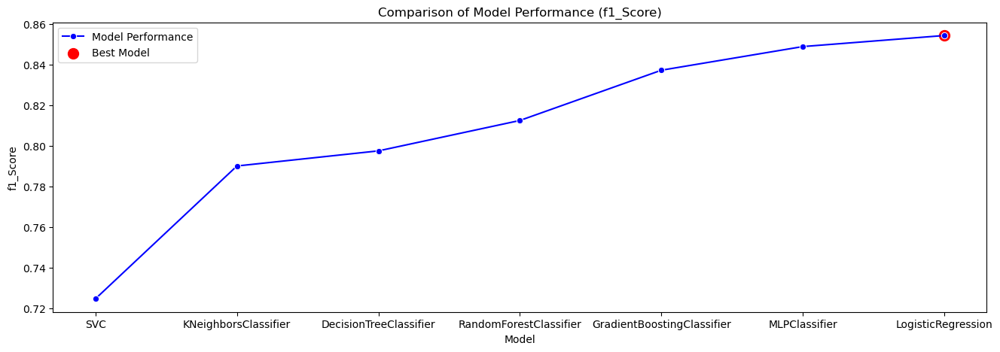

In [147]:
# Visualization
comparison_df = comparison_df.sort_values(by='f1_score', ascending=True)

max_index = comparison_df['f1_score'].idxmax()  # This returns the row index having highest f1_score

plt.figure(figsize=(16, 5))
sns.lineplot(data=comparison_df, x='Model', y='f1_score', marker='o', color='blue', label="Model Performance")

plt.scatter(comparison_df.loc[max_index, 'Model'], comparison_df.loc[max_index, 'f1_score'],color='red', s=100, label="Best Model")

plt.xlabel("Model")
plt.ylabel("f1_Score")
plt.legend()
plt.title("Comparison of Model Performance (f1_Score)")
plt.show()

## 9. Conclusion

#### -> Above lineplot specifically compares model performance using the F1-score metric, indicating a focus on balanced precision and recall.

#### -> Among all the models, 'LogisticRegression' has the highest predictive performance. Therefore, we can infer that 'LogisticRegression' will be the most suitable model for the given dataset.  

## 10. CHALLENGES FACED

#### 1. Extracting insights from the graph.
#### 2. There are many outliers in all the features, and finding the exact ouliers is very difficult.
#### 3. Took more computational time for some models.
#### 4. Improvising the model F1_score through hyperparameter tuning.

## PROJECT DETAILS:
Project Team ID : PTID-CDS-JAN-25-2368

Project ID : PRCP-1007-LiverPatientPred

Team Members:

1. Adithya E - ecadithya12@gmail.com
2. Peraisoodan Viswanath S - peraisoodanviswanath.s@gmail.com
3. Nirmal Newton M - nirmalnewton2003@gmail.com
4. Sivadhasan K - sivadhasansd@gmail.com